In [22]:
import json
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 16})

In [43]:
INSTAN_PATH_VAL = "../data/datasets/COCO/annotations/instances_train2014.json"
NUMBER_OF_SECTORS = 16

In [3]:
with open(INSTAN_PATH_VAL, "r") as json_file:
    coco = json.load(json_file)

In [4]:
image_id_to_size = {}
for object_data in coco['images']:
    image_id = str(object_data['id'])
    image_id_to_size[image_id] = (object_data['width'], object_data['height'])

In [5]:
objects = {}
for object_data in coco['annotations']:
    image_id = str(object_data['image_id'])
    bbox = object_data['bbox']
    WW, HH = image_id_to_size[image_id]
    bbox[0], bbox[1], bbox[2], bbox[3] = bbox[0] / WW, bbox[1] / HH, (bbox[0] + bbox[2]) / WW, (bbox[1] + bbox[3]) / HH
    # Centers
    bbox[0], bbox[1] = (bbox[0] + bbox[2]) * 0.5, (bbox[1] + bbox[3]) * 0.5
    if object_data['category_id'] in objects:
        objects[object_data['category_id']].append(bbox)
    else:
        objects[object_data['category_id']] = [bbox]

In [6]:
category_to_name = {}
for object_data in coco['categories']:
    category_to_name[object_data['id']] = object_data['name']

In [7]:
print(objects[2])

[[0.4882207207207207, 0.6419375, 0.9454504504504504, 0.832265625], [0.11862500000000001, 0.15275, 0.16448437500000002, 0.19412500000000002], [0.3986640625, 0.7537644341801386, 0.7333125, 0.9870900692840646], [0.6492974238875878, 0.8749609374999999, 0.7203044496487119, 0.9163124999999999], [0.2599765625, 0.7891745283018867, 0.355375, 0.9817924528301886], [0.7415859375, 0.4444551282051282, 0.75584375, 0.4667628205128205], [0.06782812499999999, 0.45711111111111113, 0.128421875, 0.5080666666666667], [0.20707291666666666, 0.8915234375000001, 0.2687291666666667, 0.9434687500000001], [0.8102812500000001, 0.6160025706940874, 0.890609375, 0.6830077120822622], [0.2522109375, 0.5278393351800554, 0.297625, 0.6879501385041551], [0.45134722222222223, 0.571265625, 0.8421666666666667, 0.763375], [0.061156249999999995, 0.7853020833333333, 0.120703125, 0.9891666666666665], [0.4433437499999999, 0.7387222222222223, 0.48507812499999997, 0.8645277777777778], [0.6791484375000001, 0.6488229166666667, 0.843156

In [27]:
class HeatMap():
    def __init__(self, number_of_categories, number_of_sectors, category_to_name):
        self.number_of_categories = number_of_categories
        self.number_of_sectors = number_of_sectors
        self.category_to_name = category_to_name
        self.number_of_objects_in_category = {}
        self.heat_maps = {}
        
        for i in range(number_of_categories):
            self.heat_maps[i] = np.array([[0]*(self.number_of_sectors) for i in range(self.number_of_sectors)])
    
    def print_heat_map(self, category_id):
        for i in self.heat_maps[category_id]:
            print(i)
    
    def add_element(self, category_id, x, y):
        # Lets suppose that x, y are in range [0, 1]
        x = x * self.number_of_sectors
        y = y * self.number_of_sectors
        pos_x = int(x) 
        pos_y = int(y)
        
        if pos_x == self.number_of_sectors:
            pos_x -= 1
        if pos_y == self.number_of_sectors:
            pos_y -= 1
            
        self.heat_maps[category_id][pos_y][pos_x] += 1
        if category_id in self.number_of_objects_in_category:
            self.number_of_objects_in_category[category_id] += 1
        else:
            self.number_of_objects_in_category[category_id] = 1
    
    def show_heat_map(self, category_id):
        axis = np.arange(0, 1, 1/(self.number_of_sectors))
        
        h_m = self.heat_maps[category_id]
        
        fig, ax = plt.subplots(figsize=(15,15), )
        # self.print_heat_map(category_id)
        im = ax.imshow(h_m, cmap = 'Greens')
        cbar = ax.figure.colorbar(im, ax=ax)
        cbar.ax.set_ylabel("Number of elements", rotation=-90, va="bottom")
        
        ax.set_xticks(np.arange(len(axis)))
        ax.set_yticks(np.arange(len(axis)))
        
        ax.set_xticklabels(axis)
        ax.set_yticklabels(axis)
        
        plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
        
        for i in range(len(axis)):
            for j in range(len(axis)):
                text = ax.text(j, i, h_m[i, j],
                    ha="center", va="center", color="k")
        
        ax.set_title(self.category_to_name[category_id])
        fig.tight_layout()
        fig.savefig("./heat-map/" + str(category_id) + '.png', dpi=fig.dpi)
        plt.show()

In [28]:
def add_category_to_heat_map(heat_map, objects, category_id):
    for bbox in objects[category_id]:
        heat_map.add_element(category_id, bbox[0], bbox[1])
    

In [44]:
# create the heat map
heat_map = HeatMap(100, NUMBER_OF_SECTORS, category_to_name)

In [45]:
# heat_map.add_element(1, 1, 1)

In [46]:
# add all the categories
for key in objects.keys():
    add_category_to_heat_map(heat_map, objects, key)

In [47]:
# kite x, y 
for bbox in objects[38]:
    print(bbox[0], bbox[1])

0.22249999999999998 0.11887500000000001
0.7111015624999999 0.5415962441314555
0.8749140625 0.4247243107769424
0.7945093457943926 0.2144609375
0.83994 0.6818799999999999
0.298390625 0.32855971896955505
0.4355854800936768 0.07230468749999999
0.6278854166666666 0.734
0.5407031250000001 0.5325352112676056
0.8559687500000001 0.28551562500000005
0.5522578125000001 0.32460187353629977
0.5043203125 0.38205208333333335
0.11182189542483661 0.20383169934640522
0.38595833333333335 0.14471874999999998
0.5499336283185841 0.5699375
0.663546875 0.19166666666666665
0.4024590163934426 0.47773437500000004
0.641671875 0.699875
0.44834375 0.6963646288209607
0.5403515624999999 0.5716953125
0.8085100000000001 0.47656156156156154
0.3293208430913349 0.0512578125
0.48231 0.52732
0.49787499999999996 0.14110416666666664
0.43128125000000006 0.06545774647887323
0.7335624999999999 0.47730468750000005
0.5187916666666667 0.18295312500000002
0.5123645833333335 0.665171875
0.8971944444444445 0.26585156249999997
0.14143 

0.9586640624999999 0.6462836185819072
0.6853125 0.09846875
0.831953125 0.3329742388758782
0.23591406250000002 0.42941666666666667
0.8103629976580796 0.4126796875
0.7417100000000001 0.10646666666666668
0.29383593750000003 0.23729257641921397
0.43827343750000003 0.32285714285714284
0.6953958333333333 0.2073125
0.20783593750000004 0.7409718969555035
0.428296875 0.5730985915492958
0.64824 0.7238899999999999
0.41124121779859485 0.4837265625
0.596921875 0.6137557603686636
0.5757604166666667 0.533953125
0.5655468749999999 0.43524705882352943
0.6586406249999999 0.48023310023310023
0.24774999999999997 0.26208333333333333
0.5698281249999999 0.7082276995305166
0.8615468750000002 0.1229322429906542
0.9793359374999999 0.24544496487119438
0.5018437500000001 0.4944072164948453
0.532125 0.27658333333333335
0.649125 0.47411458333333334
0.0423984375 0.5313055555555555
0.799765625 0.6806705882352941
0.5547734375 0.25974654377880185
0.43696999999999997 0.5859866666666667
0.60281 0.31922666666666666
0.2978

0.6732291666666668 0.7049140625000001
0.58353 0.22615999999999997
0.6034999999999999 0.33099999999999996
0.28340624999999997 0.7403020833333334
0.7758125 0.6478020833333333
0.8133359375 0.21471875
0.8840546875 0.7428553921568628
0.438109375 0.52496875
0.4557394366197183 0.31551562499999997
0.4732421875 0.38017708333333333
0.5546328125 0.42160416666666667
0.5657109375 0.20453161592505859
0.7059453125 0.636288056206089
0.8707968749999999 0.49803738317757007
0.44036000000000003 0.7635733333333334
0.90045 0.9673333333333334
0.8188671875 0.34014051522248245
0.7556220657276995 0.368890625
0.8352830188679246 0.4791953125
0.018921874999999998 0.4561647058823529
0.509890625 0.569018691588785
0.55388 0.24245333333333335
0.5497890624999999 0.31275821596244124
0.3999140625 0.6776462395543176
0.4155390625 0.5317056074766355
0.4446875 0.6294895833333334
0.0708984375 0.5639252336448597
0.5850274725274726 0.054000000000000006
0.49065625000000007 0.6957863849765258
0.7738077858880779 0.6238359375
0.130

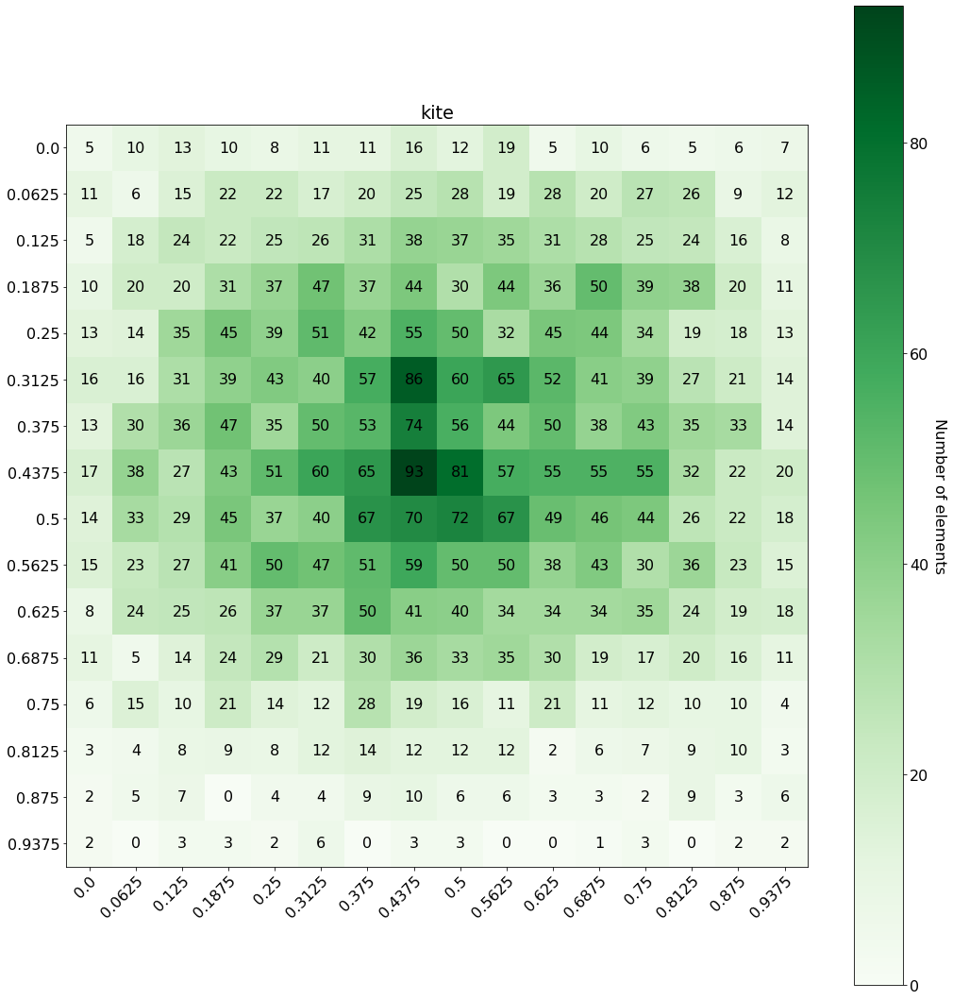

In [48]:
heat_map.show_heat_map(38)

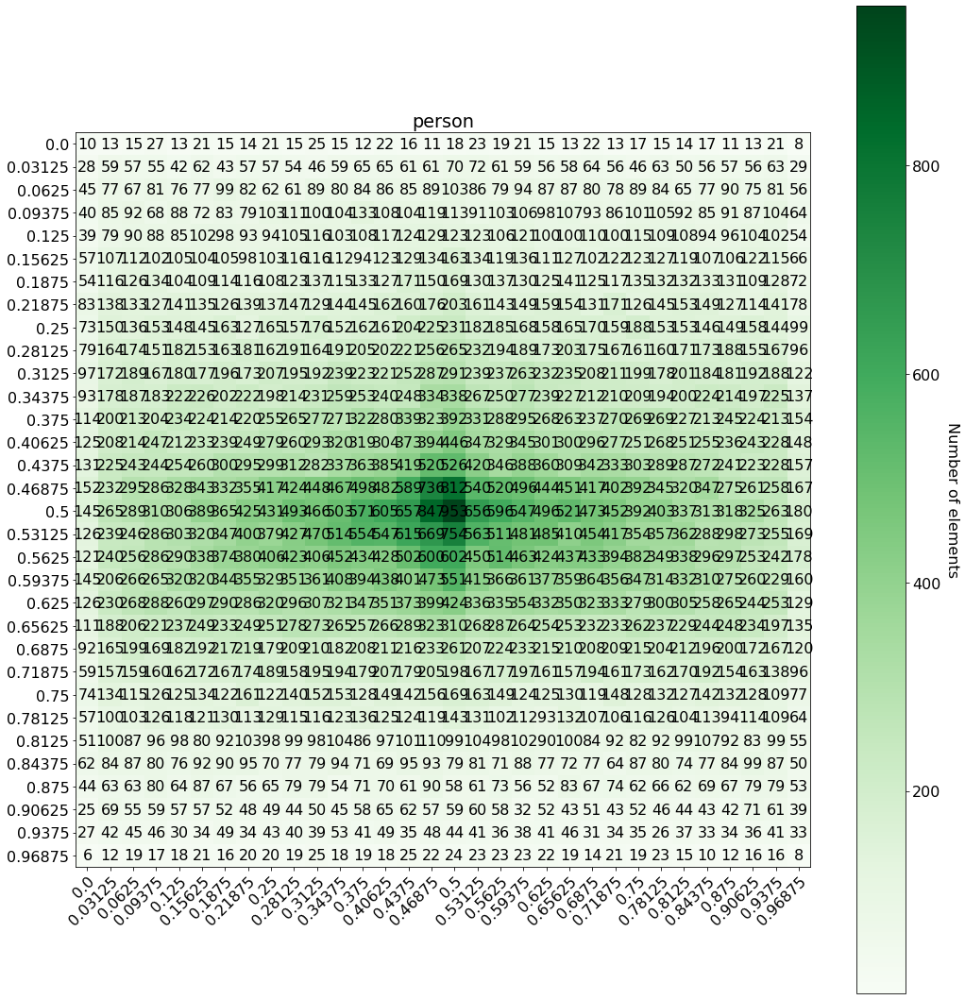

In [15]:
heat_map.show_heat_map(1)

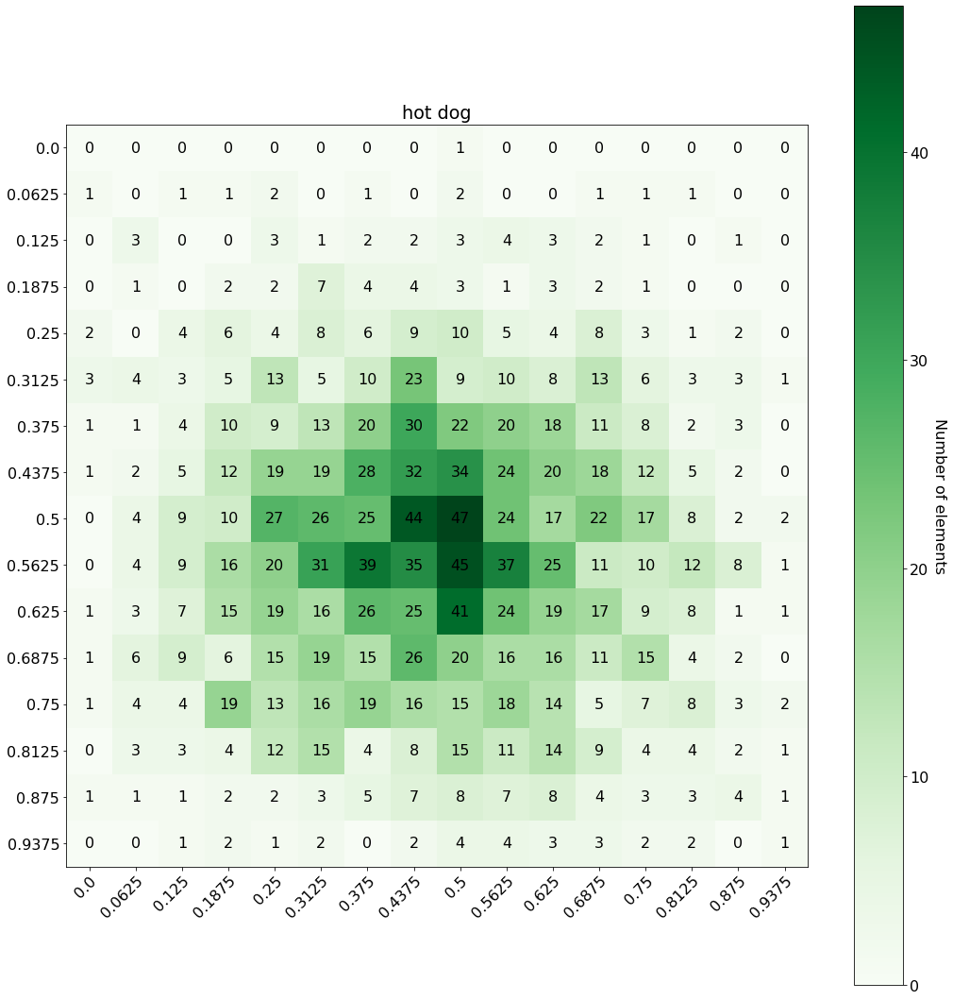

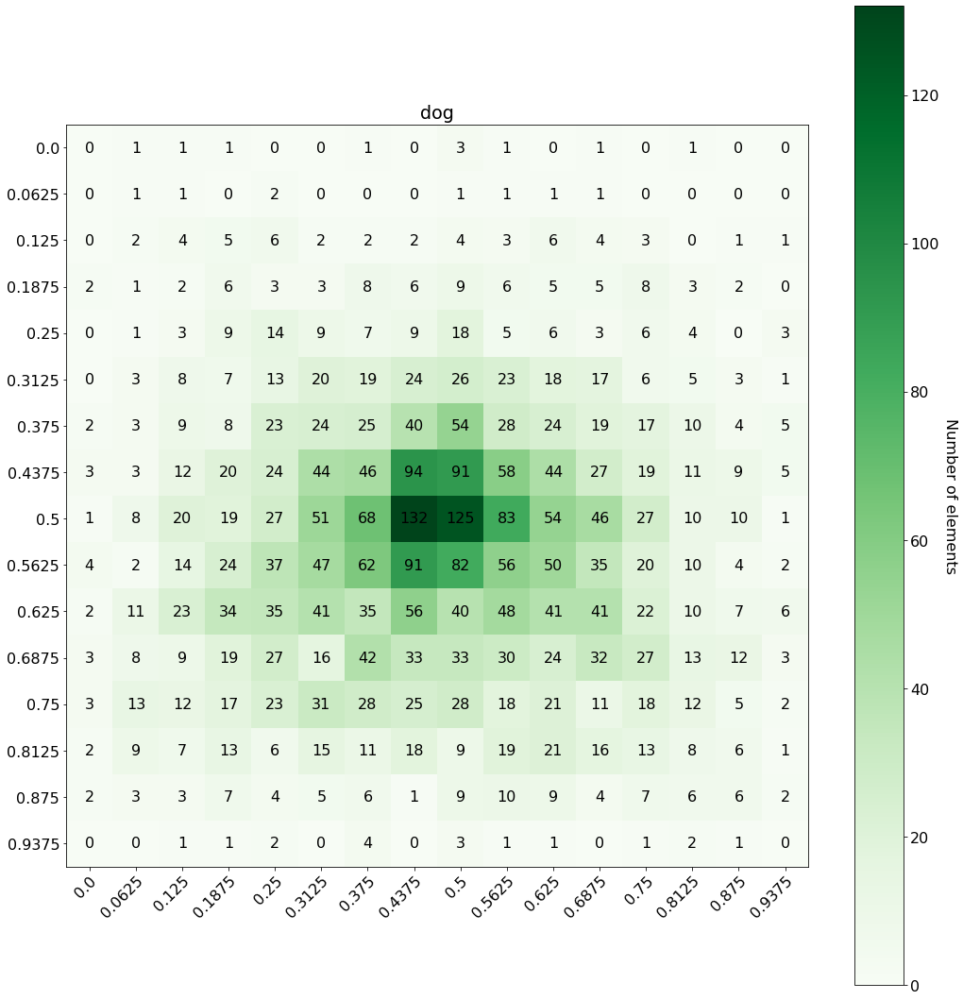

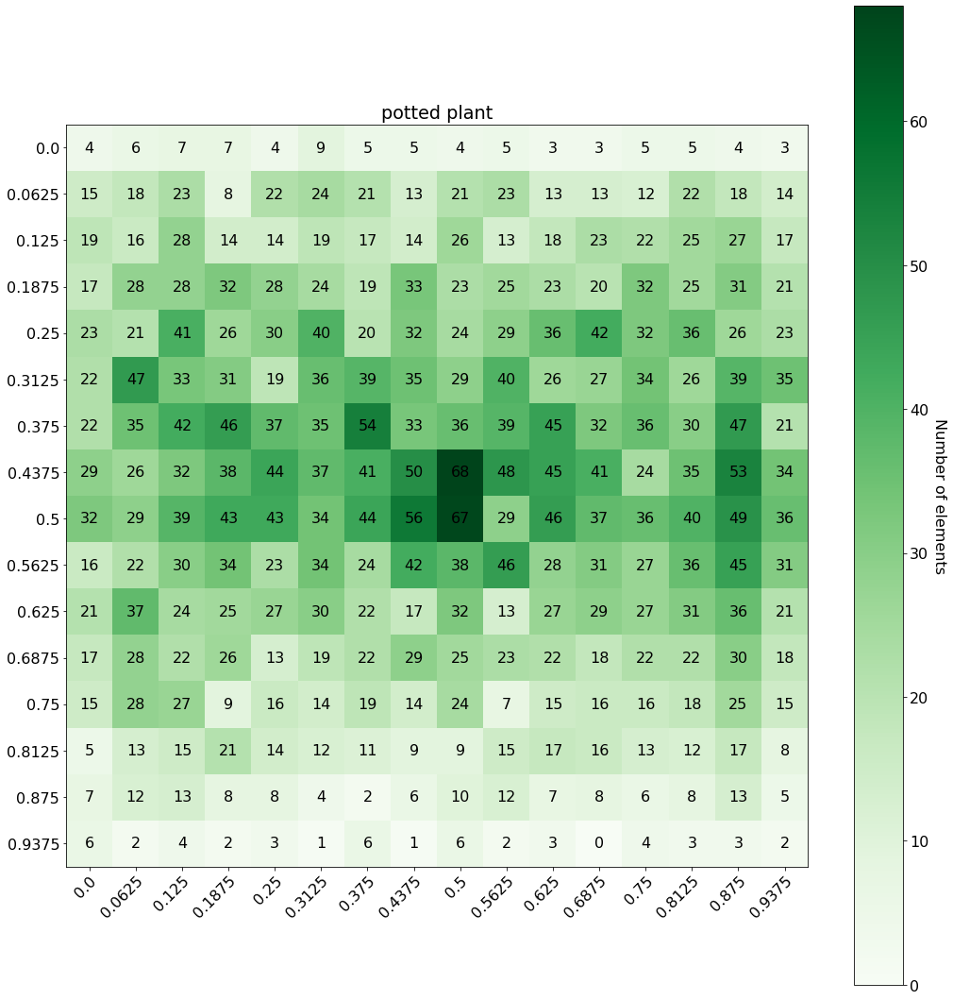

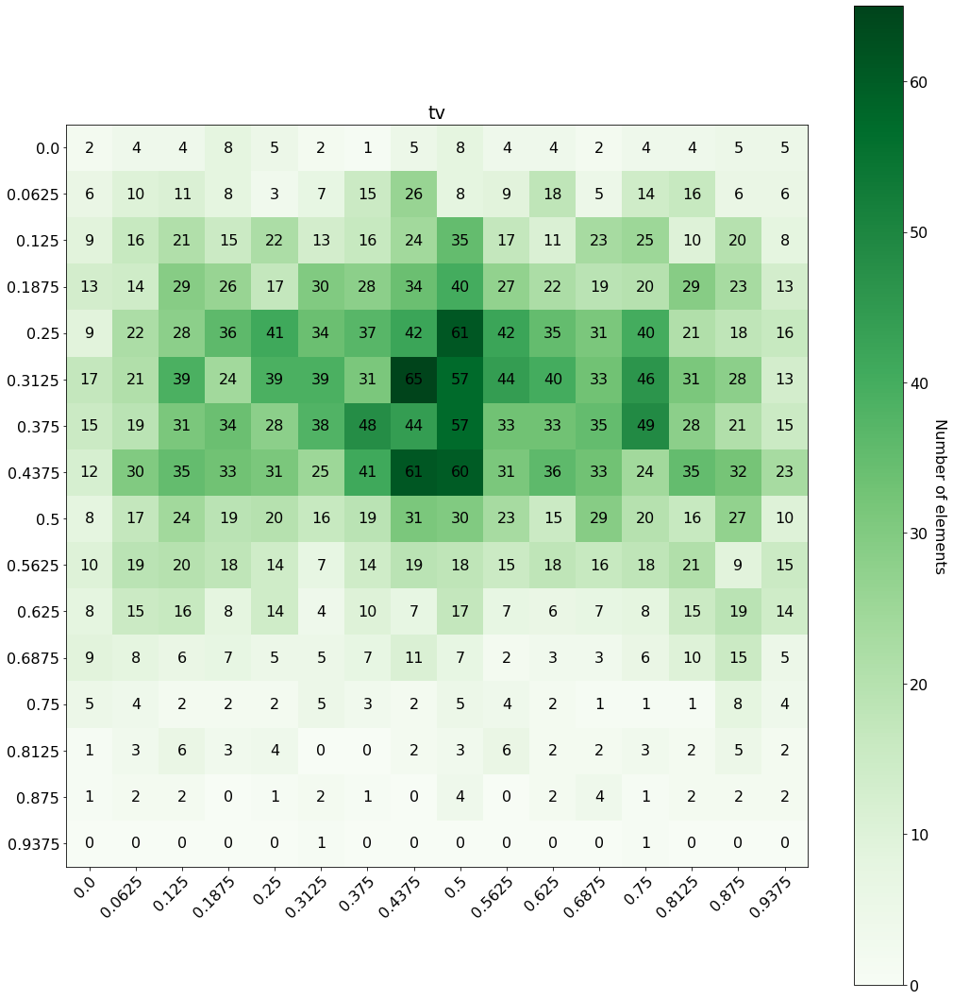

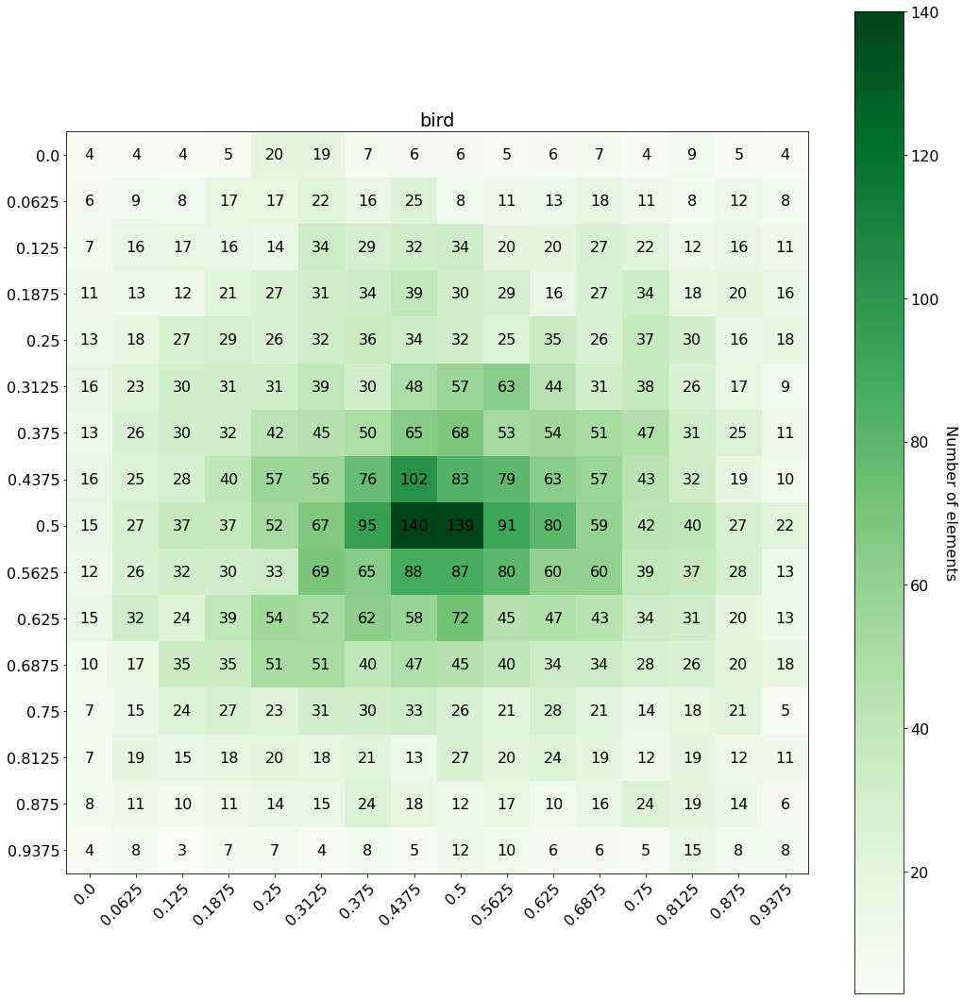

...

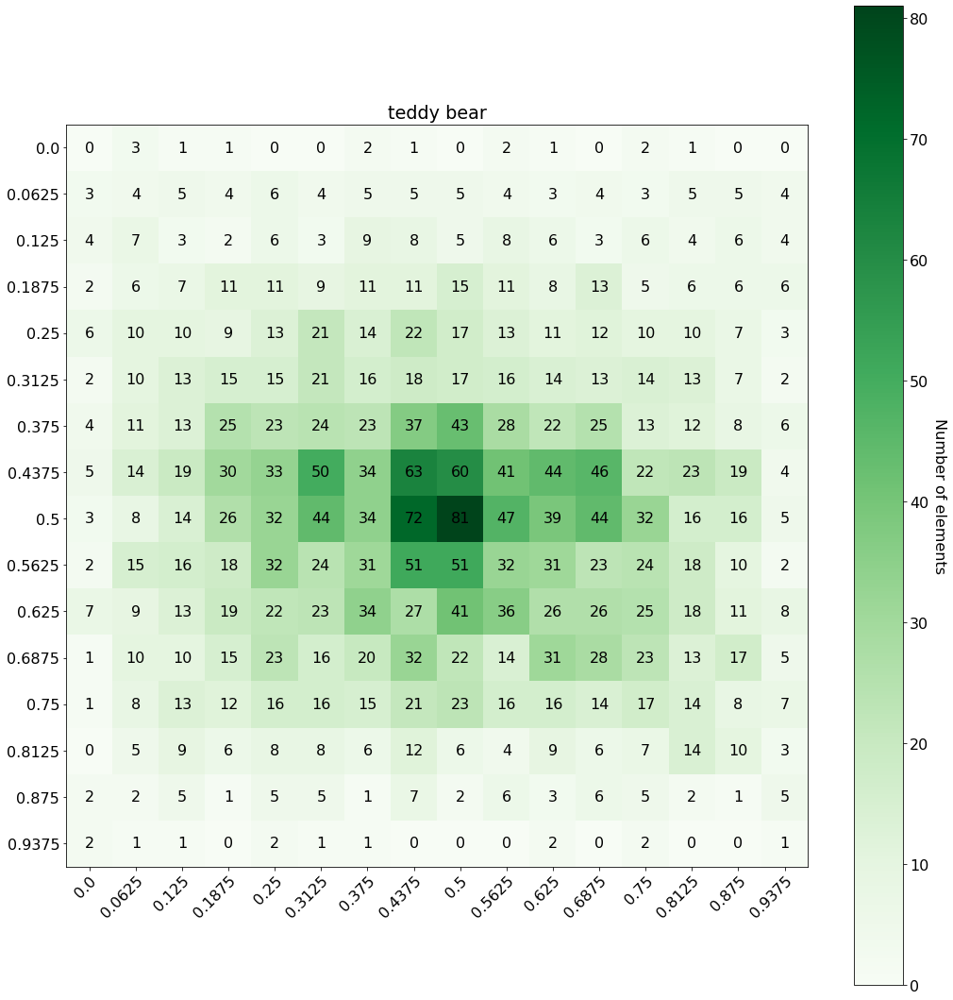

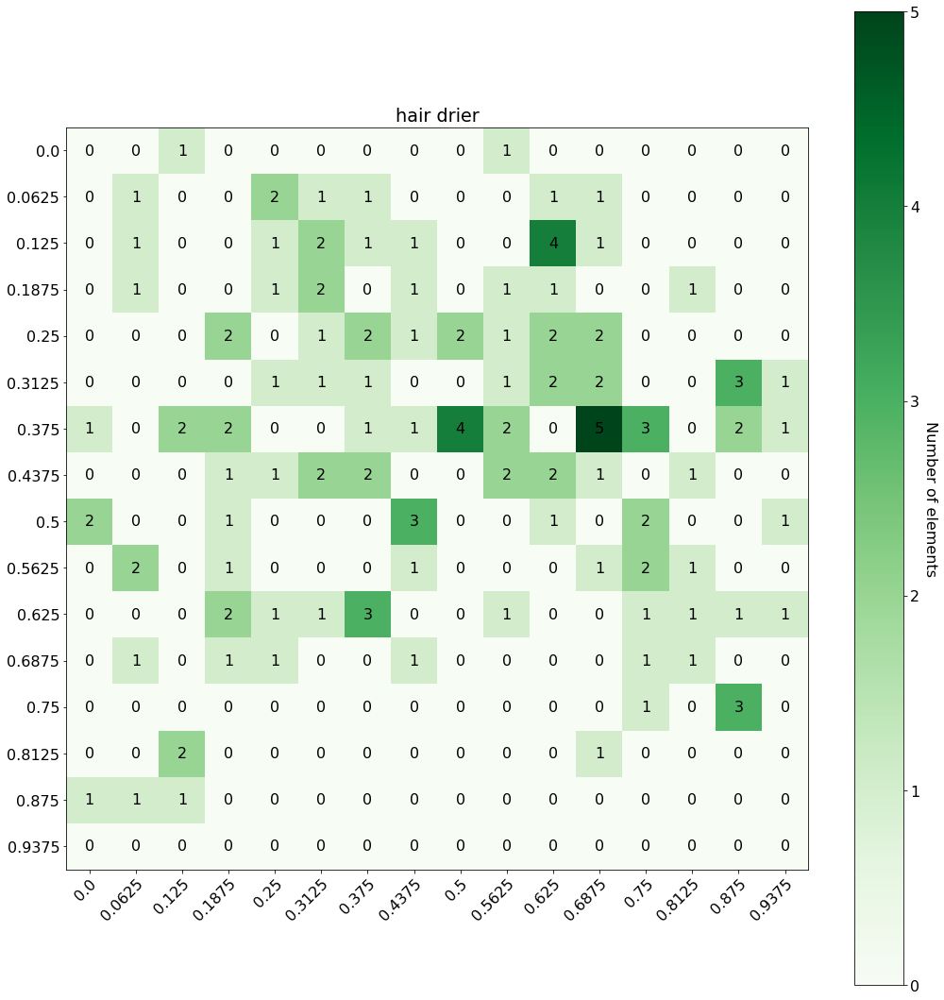

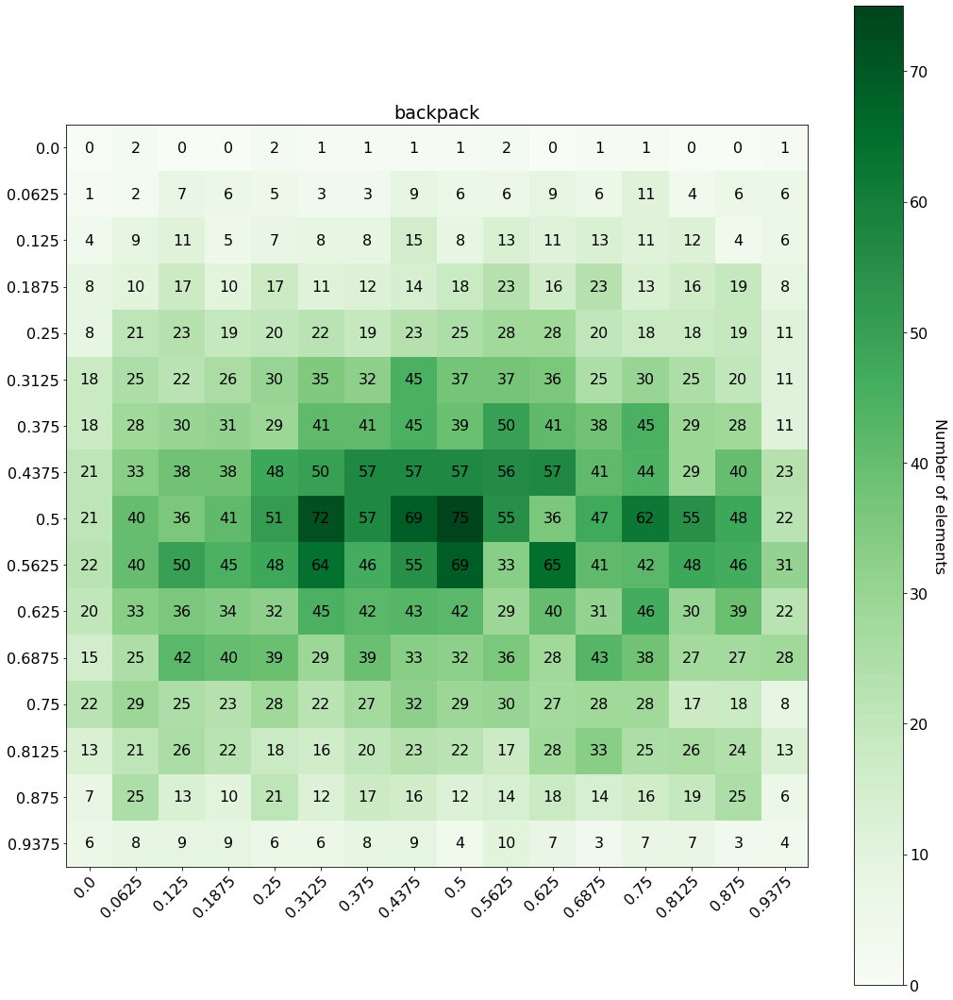

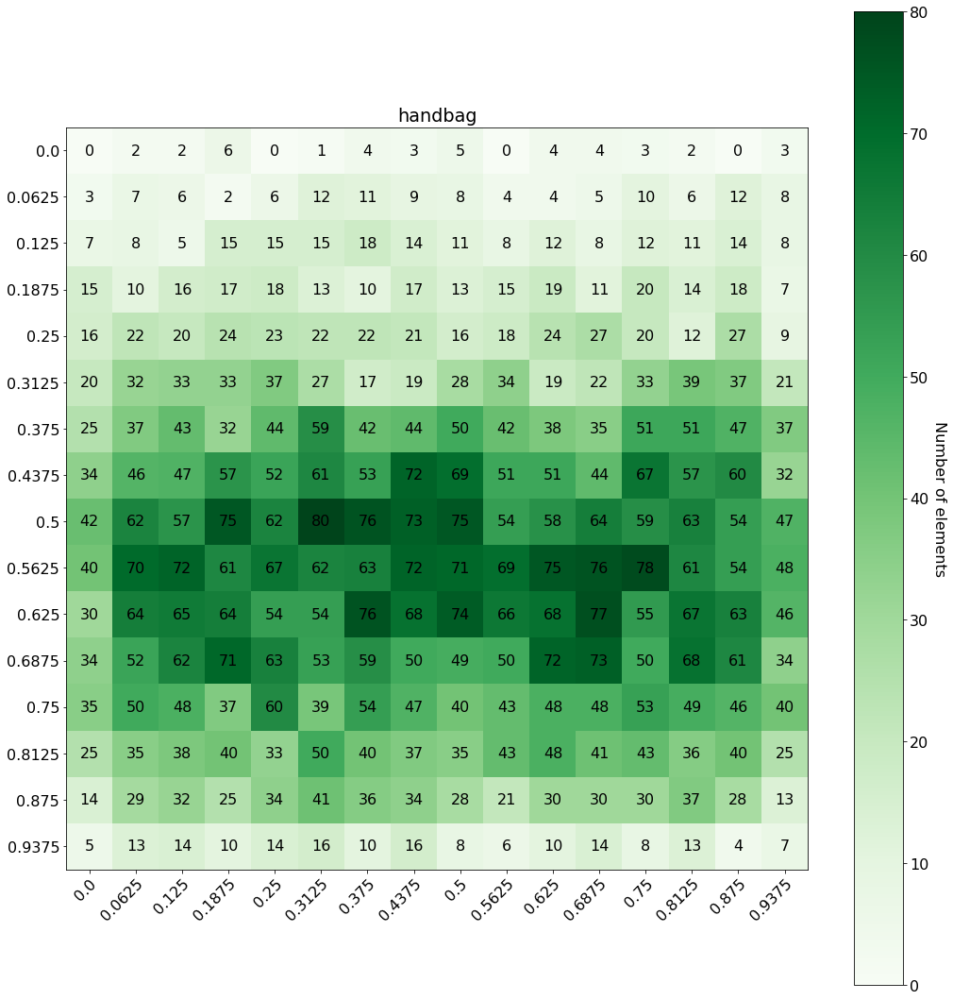

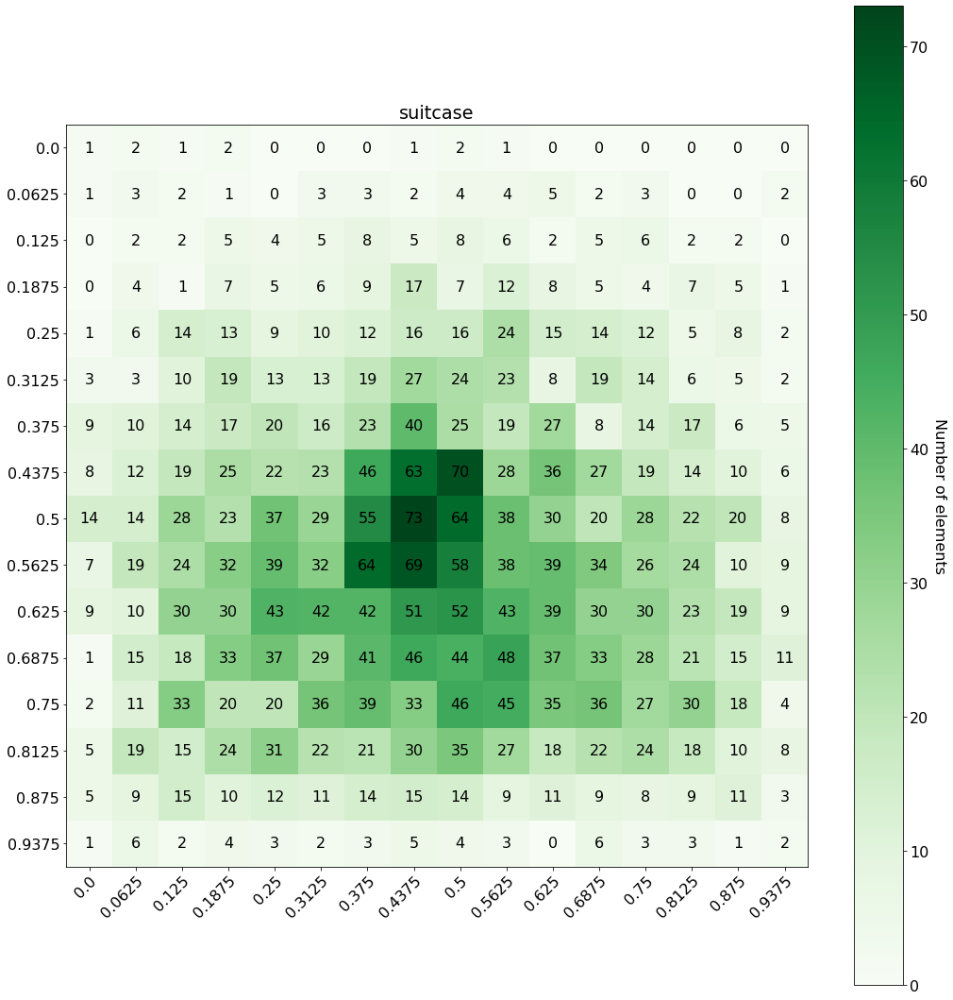

In [55]:
for key in objects.keys():
    heat_map.show_heat_map(key)

In [56]:
import imageio
import glob
images = []
filenames = list(glob.glob("./heat-map/*"))

In [58]:
print(filenames)
print(len(filenames))

['./heat-map/73.png', './heat-map/34.png', './heat-map/32.png', './heat-map/6.png', './heat-map/53.png', './heat-map/22.png', './heat-map/42.png', './heat-map/20.png', './heat-map/23.png', './heat-map/82.png', './heat-map/13.png', './heat-map/85.png', './heat-map/44.png', './heat-map/14.png', './heat-map/89.png', './heat-map/38.png', './heat-map/47.png', './heat-map/72.png', './heat-map/36.png', './heat-map/84.png', './heat-map/54.png', './heat-map/3.png', './heat-map/18.png', './heat-map/24.png', './heat-map/81.png', './heat-map/56.png', './heat-map/2.png', './heat-map/17.png', './heat-map/50.png', './heat-map/39.png', './heat-map/61.png', './heat-map/43.png', './heat-map/51.png', './heat-map/46.png', './heat-map/31.png', './heat-map/28.png', './heat-map/25.png', './heat-map/33.png', './heat-map/11.png', './heat-map/15.png', './heat-map/78.png', './heat-map/10.png', './heat-map/48.png', './heat-map/64.png', './heat-map/75.png', './heat-map/16.png', './heat-map/5.png', './heat-map/65.p

In [59]:
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave('./class_heat-map.gif', images)